# **Import Libraries**

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
from keras.metrics import Precision, Recall
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
import os
import pickle

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **DenseNet-121 Building**

In [2]:
d = tf.keras.applications.DenseNet121(include_top=False,
                   input_shape=(100,100,3),
                   pooling=None,
                   weights=None)
for i in d.layers:
  i.trainable = True

29084464/29084464 [==============================] - 0s 0us/step


In [3]:
output_avg = tf.keras.layers.GlobalAveragePooling2D()(d.output)
output_max = tf.keras.layers.GlobalMaxPooling2D()(d.output)
m = tf.keras.layers.minimum([output_avg, output_max])
m = tf.keras.layers.Dropout(0.5)(m)
m = tf.keras.layers.Dense(128, activation = "sigmoid")(m)
m = tf.keras.layers.Dropout(0.3)(m)
m = tf.keras.layers.Dense(256, activation = "relu")(m)
m = tf.keras.layers.Dropout(0.3)(m)
m = tf.keras.layers.Dense(512, activation = "relu")(m)
m = tf.keras.layers.Dropout(0.3)(m)
m = tf.keras.layers.Dense(1024, activation = "relu")(m)
m = tf.keras.layers.Dense(54, activation= "softmax")(m)
m = tf.keras.models.Model(inputs = d.input, outputs = m)
m.compile(optimizer = tf.keras.optimizers.Adam(0.001), 
          loss = "categorical_crossentropy", 
          metrics =["accuracy", 
                     Precision(name='precision'), 
                     Recall(name='recall')])
m.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 100, 100, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 106, 106, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv1/conv (Conv2D)            (None, 50, 50, 64)   9408        ['zero_padding2d[0][0]']         
                                                                                                  
 conv1/bn (BatchNormalization)  (None, 50, 50, 64)   256         ['conv1/conv[0][0]']         

# **Preprocess**

In [ ]:
def get_path(directory):
    subdirectories = []

    for name in os.listdir(directory):
        path = os.path.join(directory, name)
        if os.path.isdir(path):
            subdirectories.append(name)

    return subdirectories

# Đường dẫn tới thư mục gốc
directory_path = "/content/drive/MyDrive/Biometrics/HW1/data/train/"

# Lấy tên các thư mục con trong thư mục gốc
subdirectories = get_path(directory_path)
list_labels = [item.lstrip("pins_") for item in subdirectories]


In [ ]:
def get_image_paths(directory):
    image_paths = []

    for file_name in os.listdir(directory):
        file_path = os.path.join(directory, file_name)
        if os.path.isfile(file_path) and is_image_file(file_path):
            image_paths.append(file_path)

    return image_paths

def is_image_file(file_path):
    image_extensions = ['.jpg', '.jpeg', '.png', '.gif']  # Các phần mở rộng file hình ảnh có thể mở rộng

    return any(file_path.lower().endswith(extension) for extension in image_extensions)


In [ ]:
def load_data(type_data, current_label):
  images = []
  directory_path = "/content/drive/MyDrive/Biometrics/HW1/data/" + type_data + '/' + current_label + '/'
  image_paths = get_image_paths(directory_path)

  for image_path in image_paths:
    image = cv2.imread(image_path)
    image = cv2.resize(image, (100, 100))
    image = image/255
    images.append(image)
  
  return images     

In [ ]:
# Augmentation
image_augentation = tf.keras.preprocessing.image.ImageDataGenerator(
        rotation_range=0.35,
        zoom_range=0.2,
        horizontal_flip=True,
        vertical_flip=True,
        shear_range=0.2,
        width_shift_range=0.15,
        height_shift_range=0.15,
        rescale=None)

In [ ]:
def gen_more_images(images):
  more_images = []
  for index, image in enumerate(images):
    for i in range(3):
      generated_image = image_augentation.flow(np.reshape(image, (1, 100, 100, 3))).next()
      more_images.append(np.reshape(generated_image, (100, 100, 3)))
    
  return more_images

In [ ]:
train_images = []
train_labels = []
for label in range(len(list_labels)):
  images = load_data('train', subdirectories[label])
  more_images = gen_more_images(images)
  labels = [[0 for i in range(len(list_labels))] for j in range(len(more_images))]
  for i in range(len(more_images)):
    labels[i][label] = 1

  train_images.extend(more_images)
  train_labels.extend(labels)

train_images = np.asarray(train_images)
train_labels = np.asarray(train_labels)

In [ ]:
val_images = []
val_labels = []
for label in range(len(list_labels)):
  print(label)
  images = load_data('test', subdirectories[label])
  labels = [label for i in range(len(images))]

  val_images.extend(images)
  val_labels.extend(labels)

val_images = np.asarray(val_images)
val_labels = np.asarray(val_labels)

In [ ]:
#Save data to reuse later
np.save('/content/drive/MyDrive/Biometrics/HW1/train_more_images.npy', train_images)
np.save('/content/drive/MyDrive/Biometrics/HW1/train_more_labels.npy', train_labels)
np.save('/content/drive/MyDrive/Biometrics/HW1/val_images.npy', val_images)
np.save('/content/drive/MyDrive/Biometrics/HW1/val_labels.npy', val_labels)

# **Model training**

### 1. Load checkpoint (if exist)

In [8]:
m.load_weights('/content/drive/MyDrive/Biometrics/HW1/weights/model_weights_l2.h5')

### 2. Train model

In [ ]:
history = m.fit(train_images, train_labels, epochs = 50, batch_size = 256,
                callbacks = [tf.keras.callbacks.ReduceLROnPlateau(monitor='loss', factor=0.1, mode = 'min',patience= 1),
                            tf.keras.callbacks.EarlyStopping(monitor = 'loss', patience = 3, mode = 'min', restore_best_weights = True)])

In [7]:
#Save weights
m.save_weights('/content/drive/MyDrive/Biometrics/HW1/model_weights_l2.h5')

# **Evaluation**

### 1. Training set

In [11]:
train_preds = m.predict(train_images)
train_preds = np.argmax(train_preds, axis = 1)

668/668 [==============================] - 15s 23ms/step


In [33]:
accuracy = accuracy_score(np.argmax(train_labels, axis = 1), train_preds)
recall = recall_score(np.argmax(train_labels, axis = 1), train_preds, average='macro')
precision = precision_score(np.argmax(train_labels, axis = 1), train_preds, average='macro')
f1 = f1_score(np.argmax(train_labels, axis = 1), train_preds, average='macro')

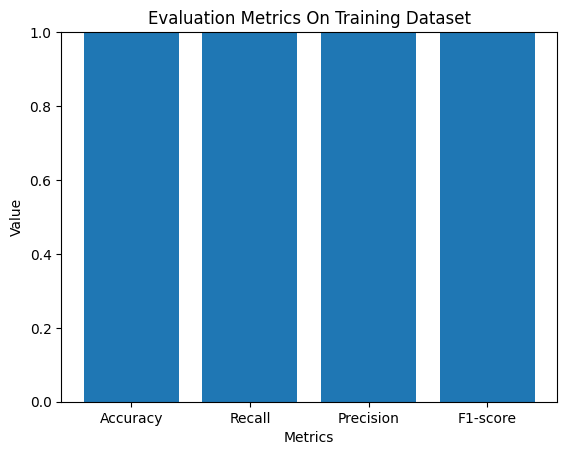

In [35]:
metrics = ['Accuracy', 'Recall', 'Precision', 'F1-score']
values = [accuracy, recall, precision, f1]

# Vẽ biểu đồ cột
plt.bar(metrics, values)
plt.ylim(0, 1)  
plt.xlabel('Metrics')
plt.ylabel('Value')
plt.title('Evaluation Metrics On Training Dataset')
plt.show()

### 2. Validation set

In [27]:
val_preds = m.predict(val_images)
val_preds = np.argmax(val_preds, axis = 1)

57/57 [==============================] - 3s 49ms/step


In [29]:
accuracy = accuracy_score(val_labels, val_preds)
recall = recall_score(val_labels, val_preds, average='macro')
precision = precision_score(val_labels, val_preds, average='macro')
f1 = f1_score(val_labels, val_preds, average='macro')

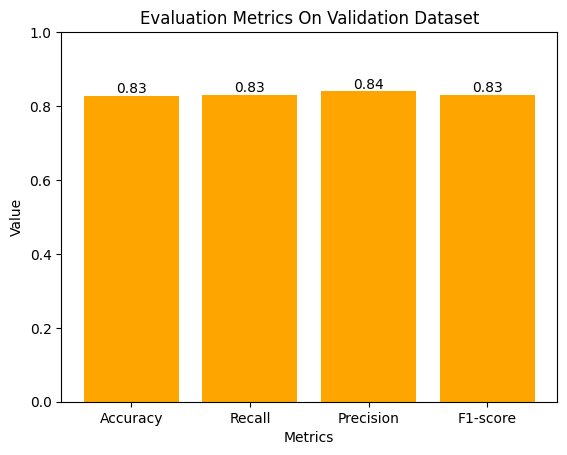

In [32]:
metrics = ['Accuracy', 'Recall', 'Precision', 'F1-score']
values = [accuracy, recall, precision, f1]

# Vẽ biểu đồ cột
plt.bar(metrics, values, color = 'orange')
plt.ylim(0, 1)  
plt.xlabel('Metrics')
plt.ylabel('Value')
plt.title('Evaluation Metrics On Validation Dataset')
# Thêm chỉ số cho mỗi cột
for i, v in enumerate(values):
    plt.text(i, v, str(round(v, 2)), ha='center', va='bottom')
plt.show()

# **Test some examples**

In [42]:
def preprocess(image_path):
  image = cv2.imread(image_path)
  image = cv2.resize(image, (100, 100))
  image = image/255
  return image

Actual: Cristiano Ronaldo
1/1 [==============================] - 0s 29ms/step
Predict:  Cristiano Ronaldo


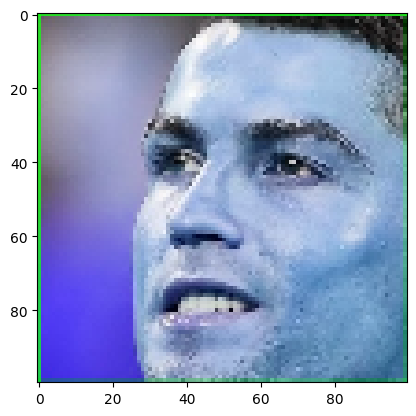

In [46]:
test_img = []
image = preprocess('/content/drive/MyDrive/Lab01/output_face.jpg')
test_img.append(image)
test_img = np.asarray(test_img)
print('Actual: Cristiano Ronaldo')
print('Predict: ', list_labels[np.argmax(m.predict(test_img))])
plt.imshow(image)
plt.show()

Actual: Alvaro Morte
1/1 [==============================] - 0s 31ms/step
Predict:  Alvaro Morte


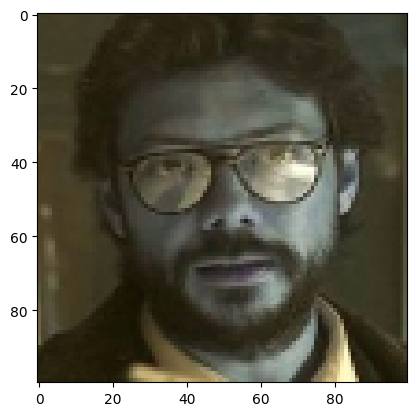

In [48]:
test_img = []
image = preprocess('/content/drive/MyDrive/Lab01/Screenshot 2023-05-31 223735.jpg')
test_img.append(image)
test_img = np.asarray(test_img)
print('Actual: Alvaro Morte')
print('Predict: ', list_labels[np.argmax(m.predict(test_img))])
plt.imshow(image)
plt.show()

Actual: Adriana Lima
1/1 [==============================] - 0s 28ms/step
Predict:  Adriana Lima


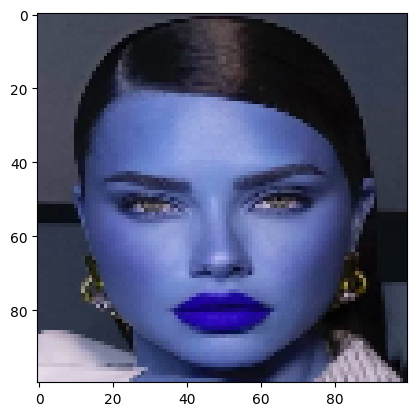

In [50]:
test_img = []
image = preprocess('/content/drive/MyDrive/Lab01/Screenshot 2023-05-31 223819.jpg')
test_img.append(image)
test_img = np.asarray(test_img)
print('Actual: Adriana Lima')
print('Predict: ', list_labels[np.argmax(m.predict(test_img))])
plt.imshow(image)
plt.show()

Actual: Alexandra Daddario
1/1 [==============================] - 0s 53ms/step
Predict:  Alexandra Daddario


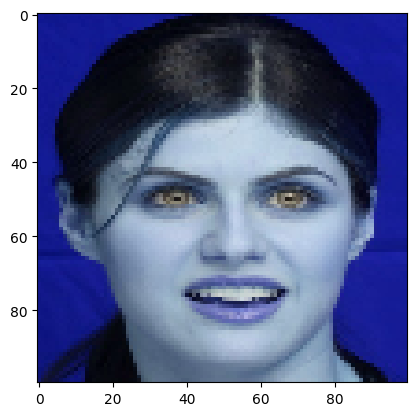

In [52]:
test_img = []
image = preprocess('/content/drive/MyDrive/Lab01/Screenshot 2023-05-31 223848.jpg')
test_img.append(image)
test_img = np.asarray(test_img)
print('Actual: Alexandra Daddario')
print('Predict: ', list_labels[np.argmax(m.predict(test_img))])
plt.imshow(image)
plt.show()

In [37]:
from google.colab.patches import cv2_imshow

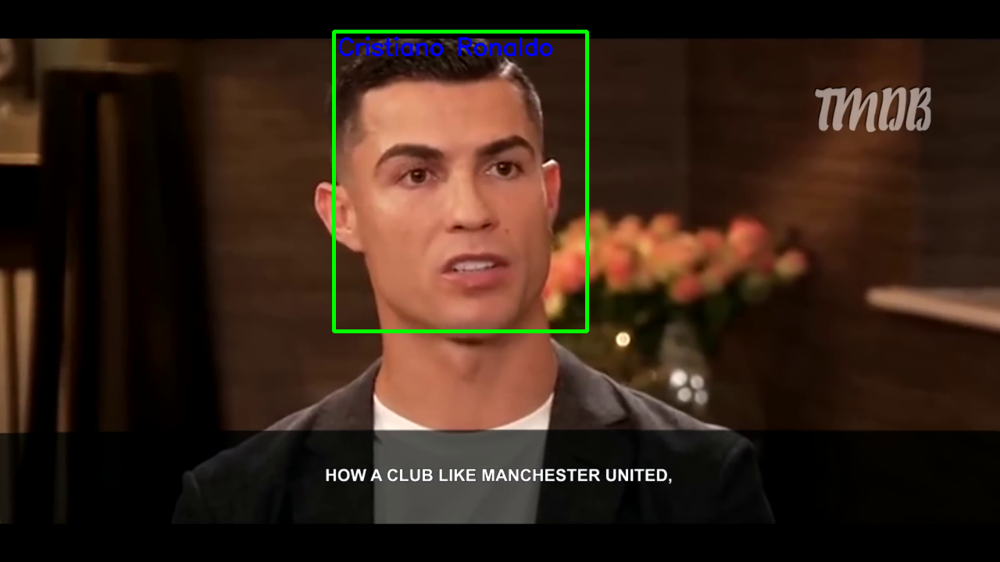

1/1 [==============================] - 0s 42ms/step


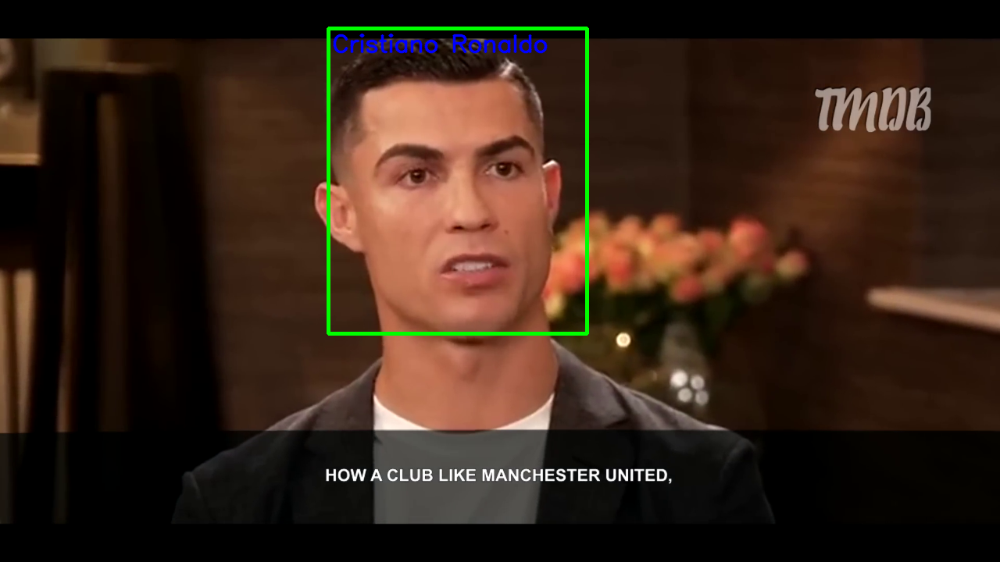

1/1 [==============================] - 0s 60ms/step


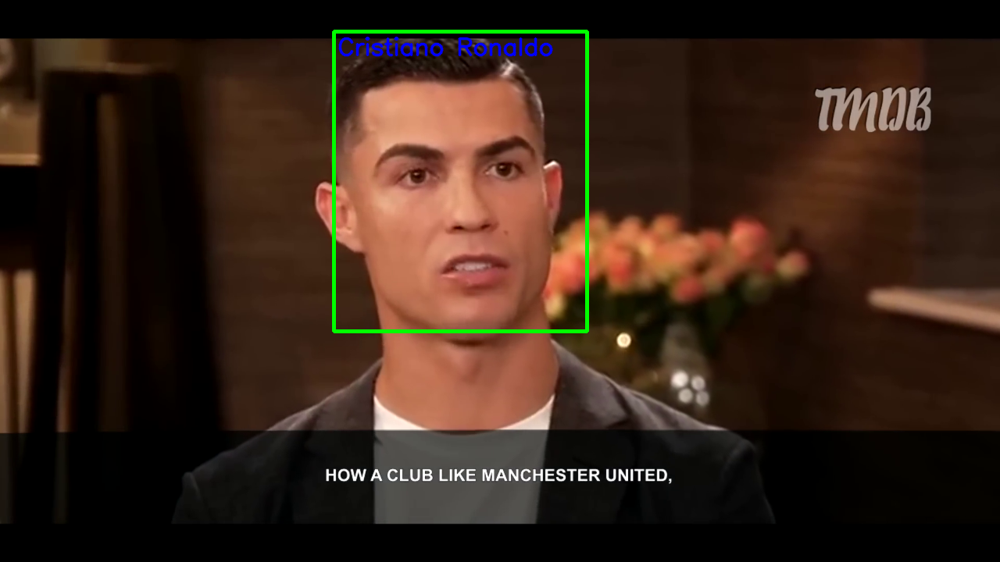

1/1 [==============================] - 0s 41ms/step


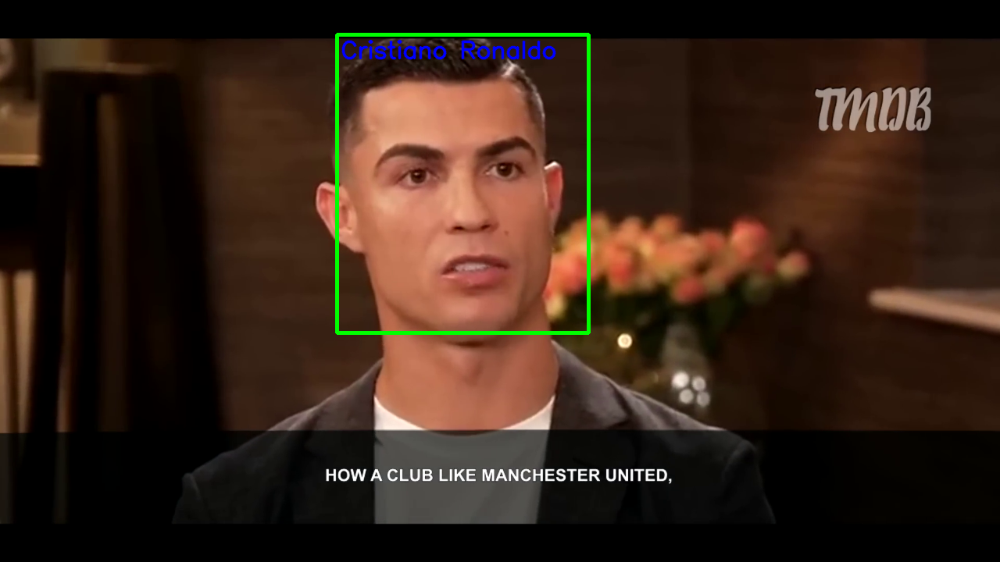

1/1 [==============================] - 0s 74ms/step


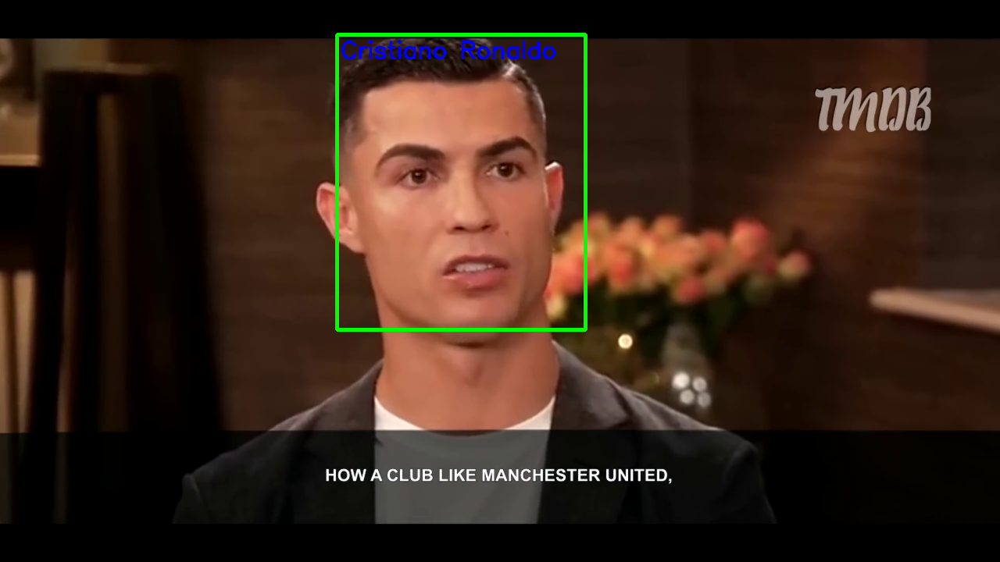

1/1 [==============================] - 0s 44ms/step


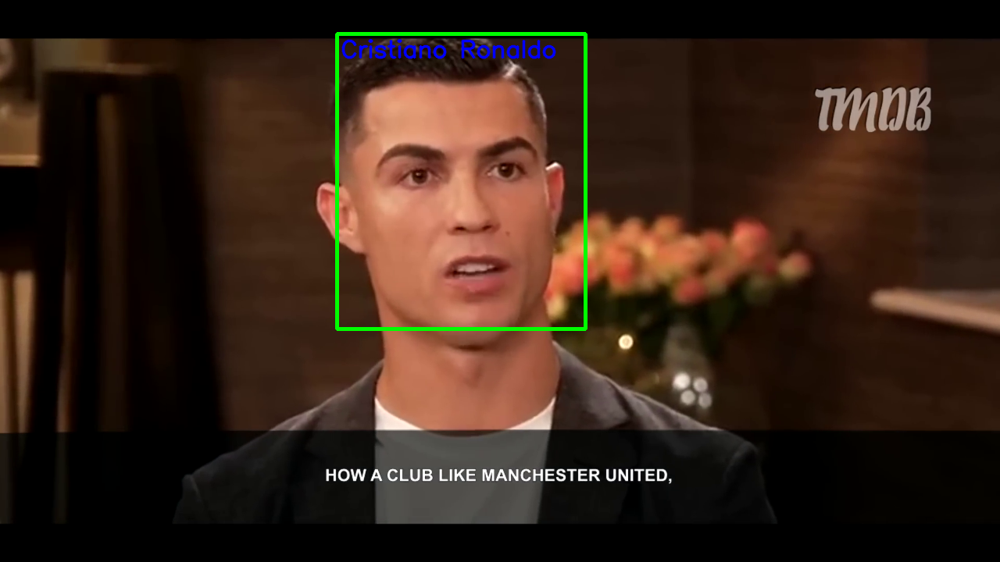

1/1 [==============================] - 0s 66ms/step


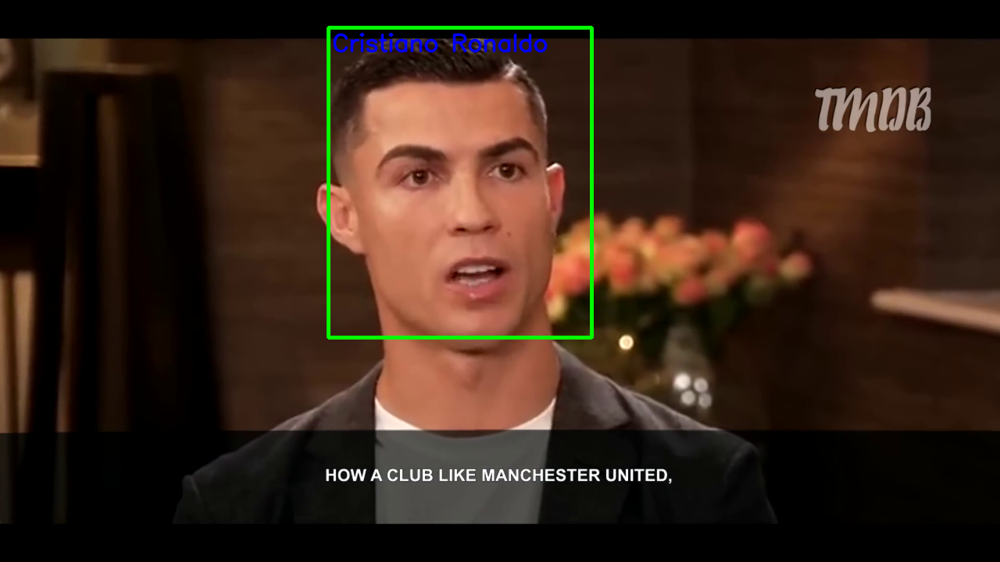

1/1 [==============================] - 0s 43ms/step


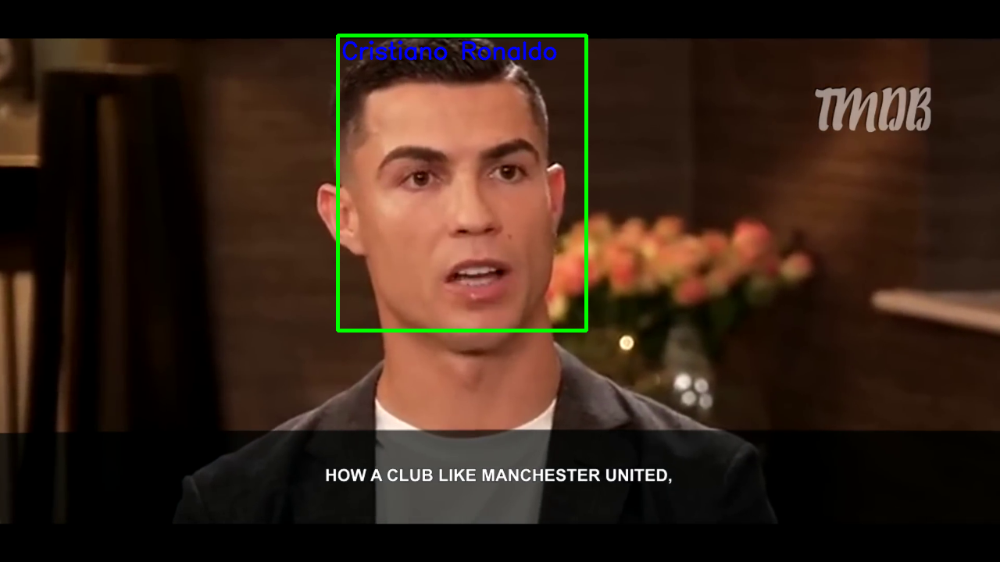

1/1 [==============================] - 0s 49ms/step


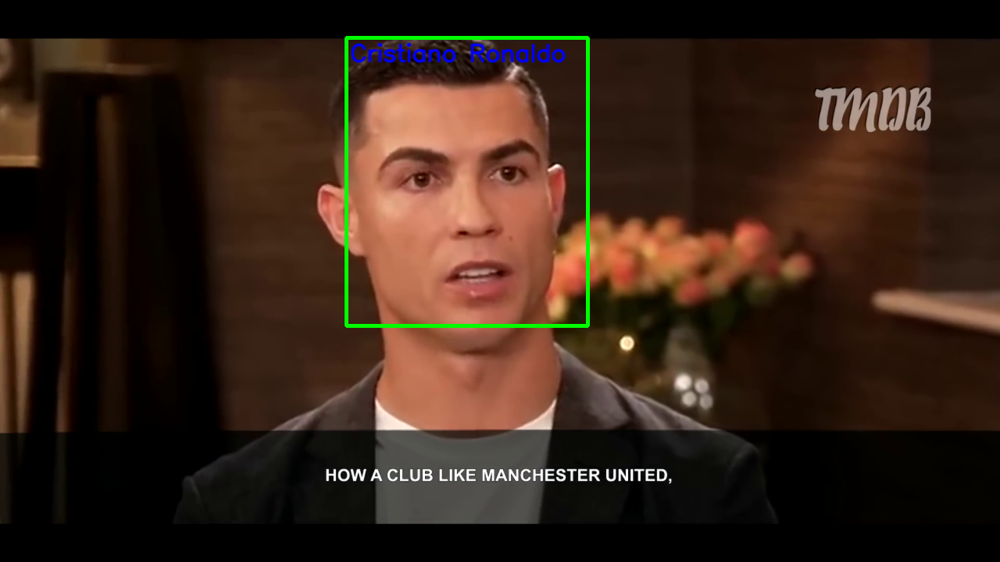

1/1 [==============================] - 0s 66ms/step


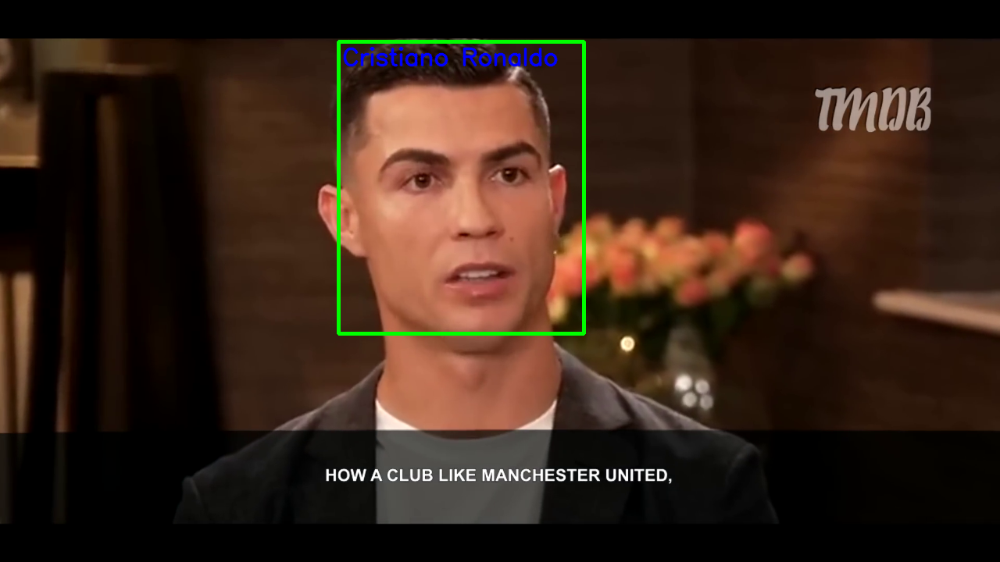

1/1 [==============================] - 0s 40ms/step


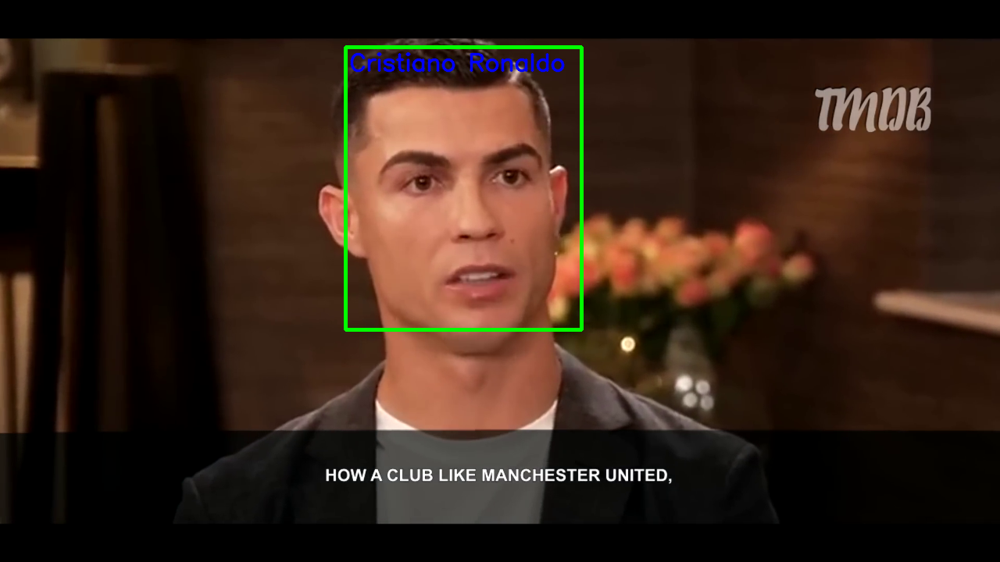

1/1 [==============================] - 0s 41ms/step


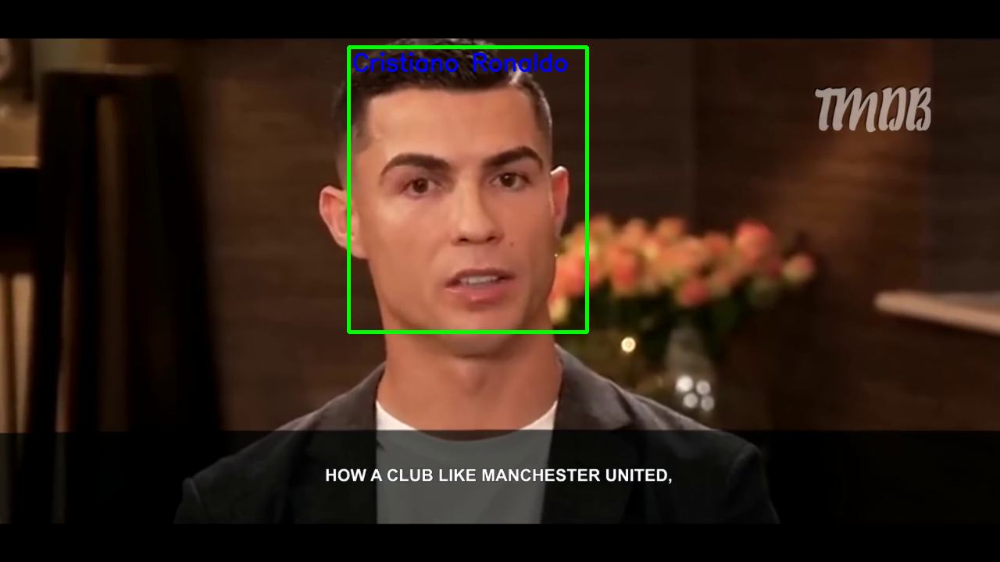

1/1 [==============================] - 0s 43ms/step


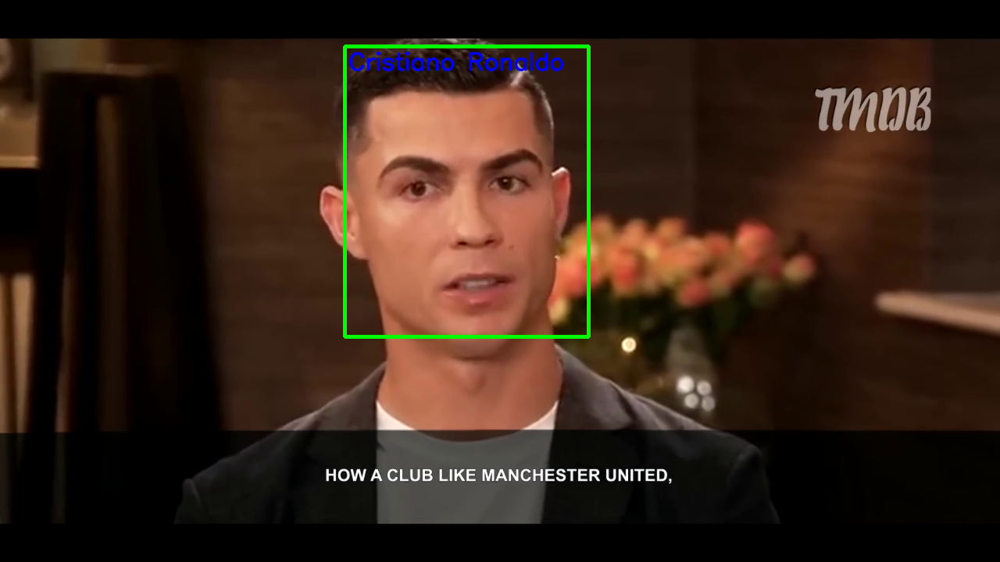

1/1 [==============================] - 0s 38ms/step


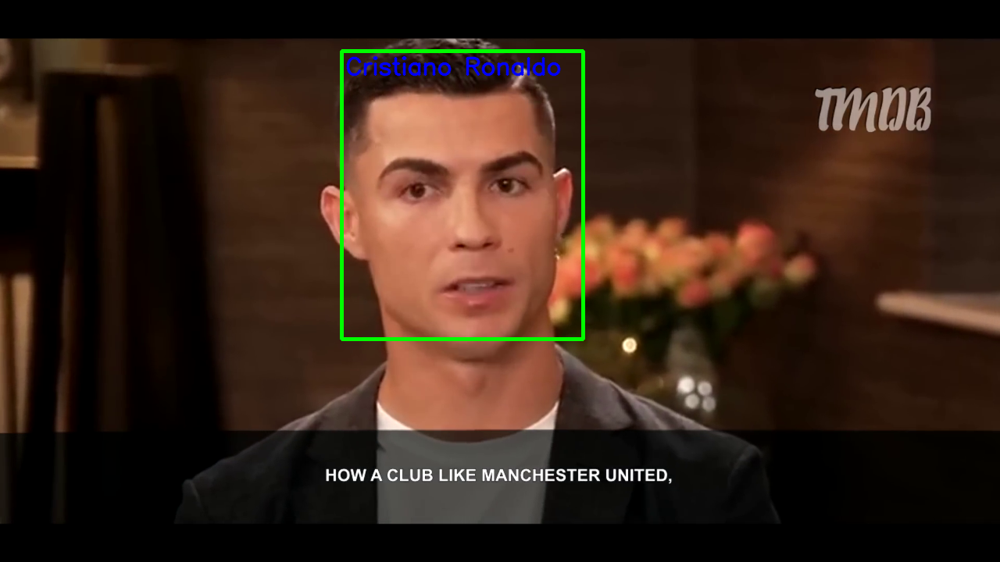

1/1 [==============================] - 0s 46ms/step


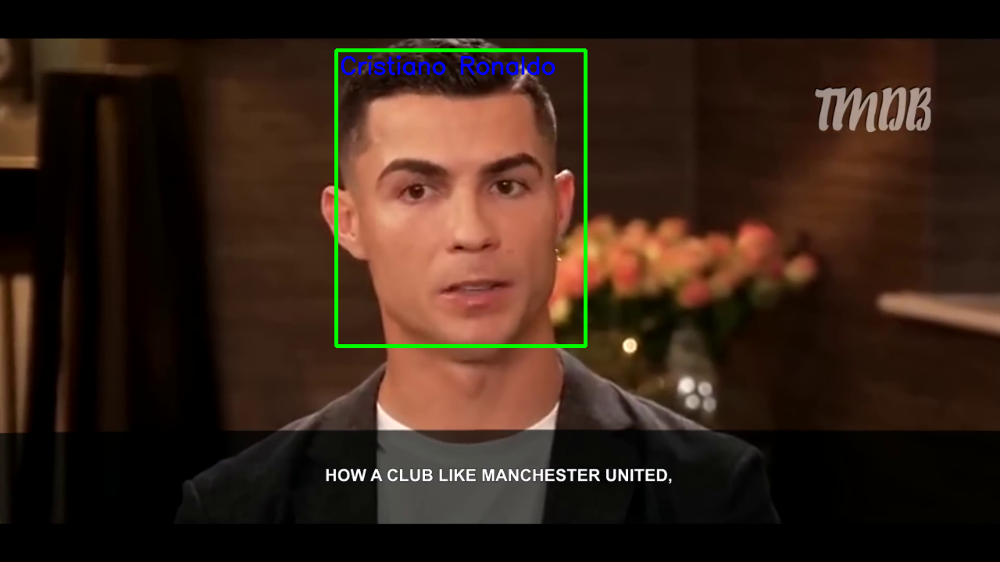

1/1 [==============================] - 0s 38ms/step


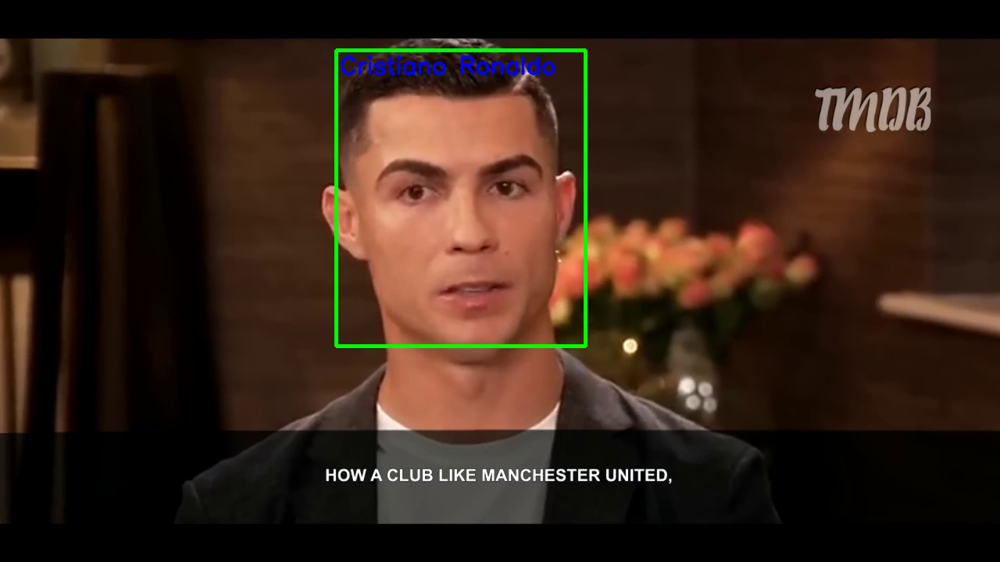

1/1 [==============================] - 0s 41ms/step


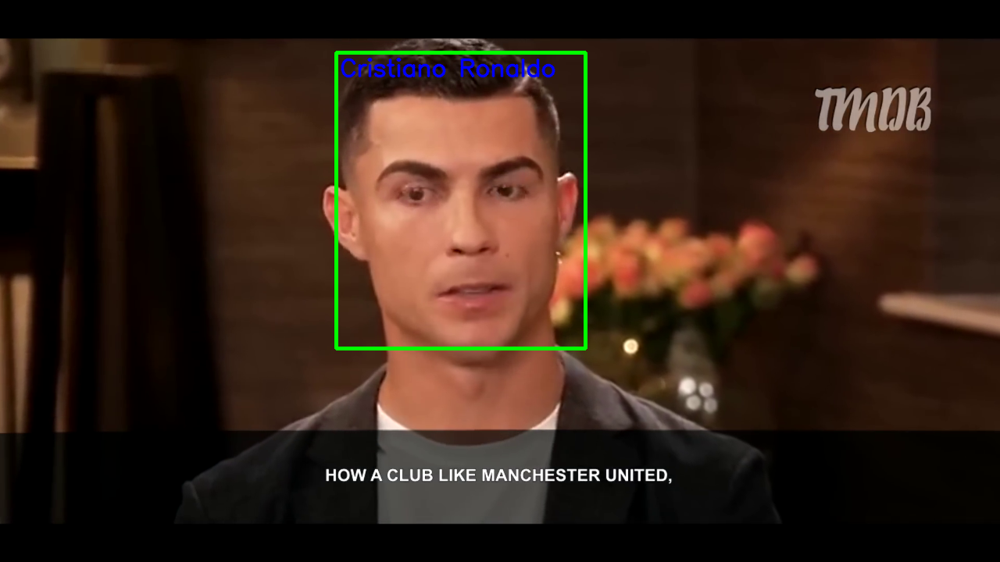

1/1 [==============================] - 0s 46ms/step


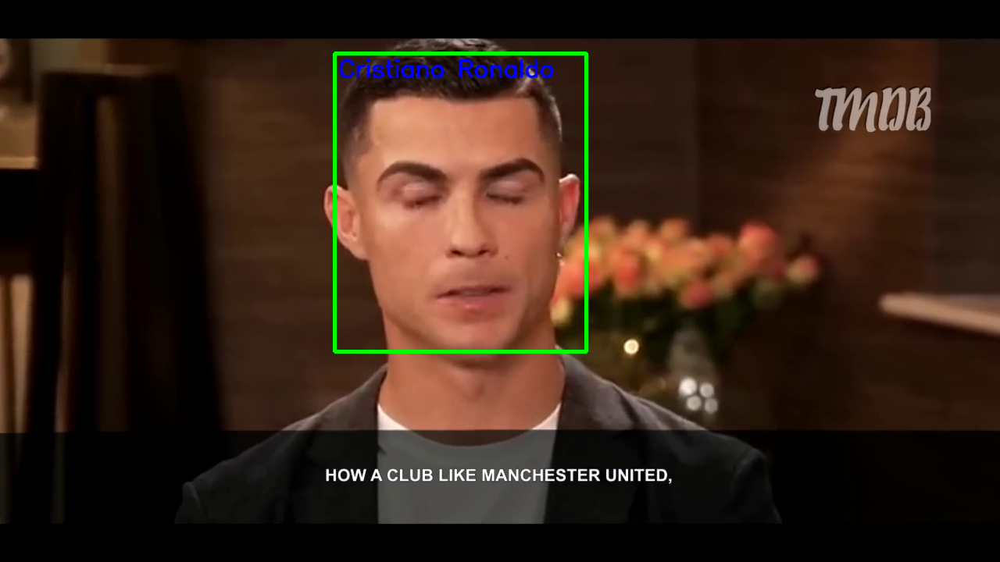

1/1 [==============================] - 0s 39ms/step


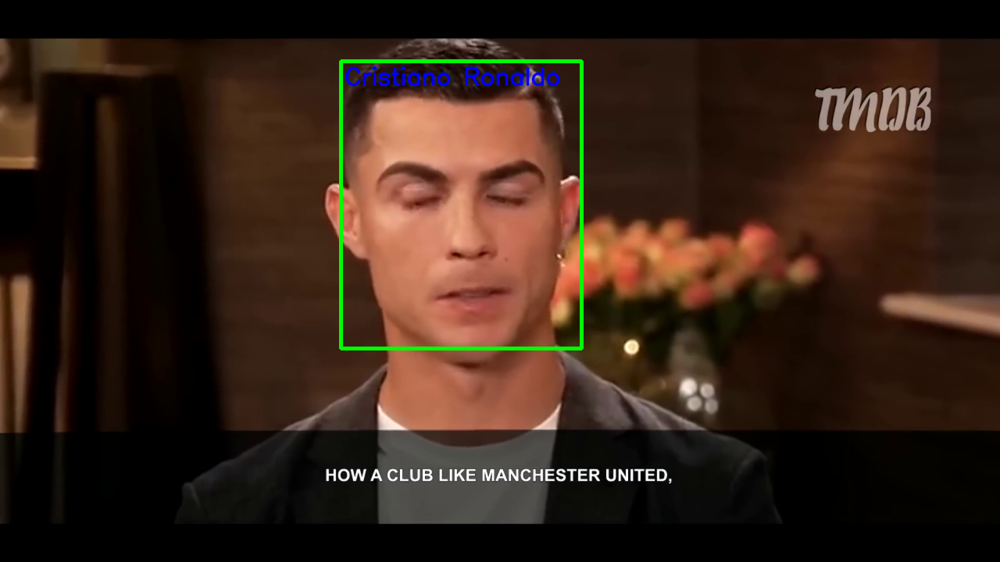

1/1 [==============================] - 0s 41ms/step


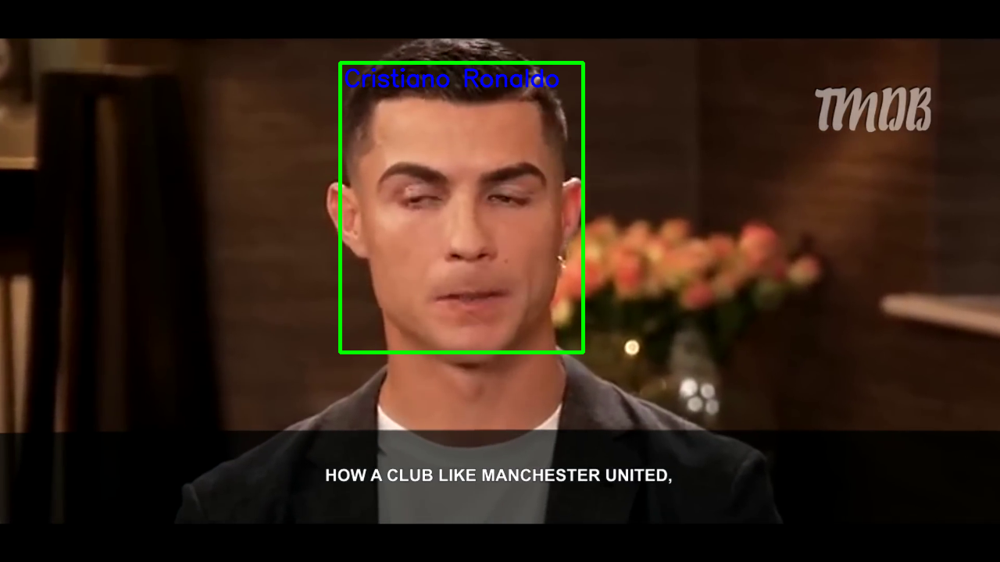

1/1 [==============================] - 0s 136ms/step


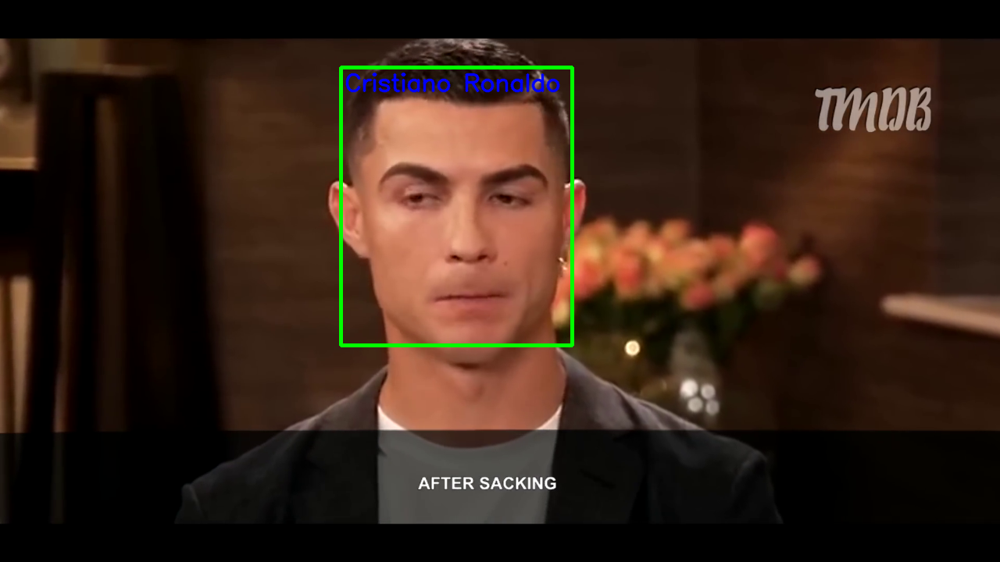

1/1 [==============================] - 0s 79ms/step


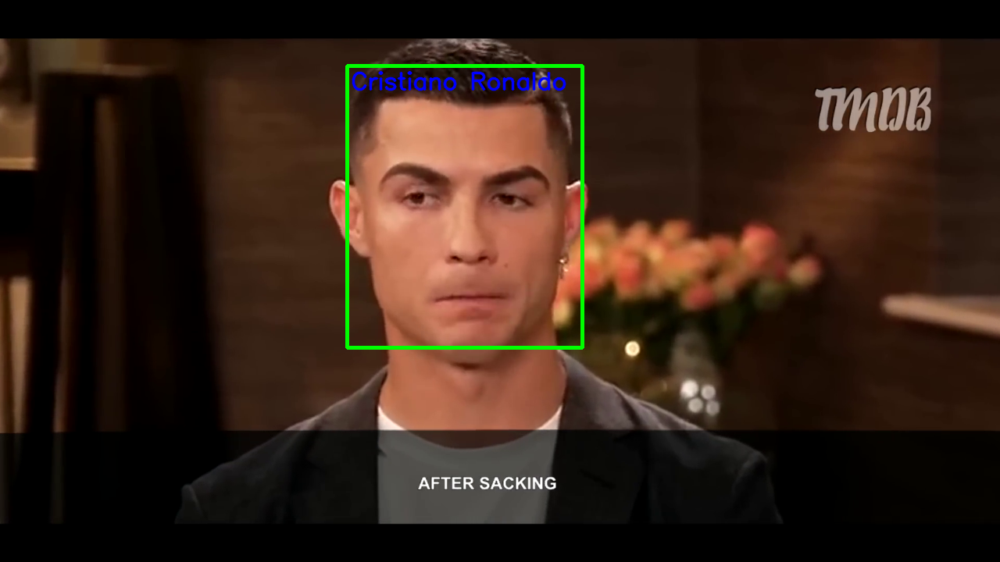

1/1 [==============================] - 0s 39ms/step


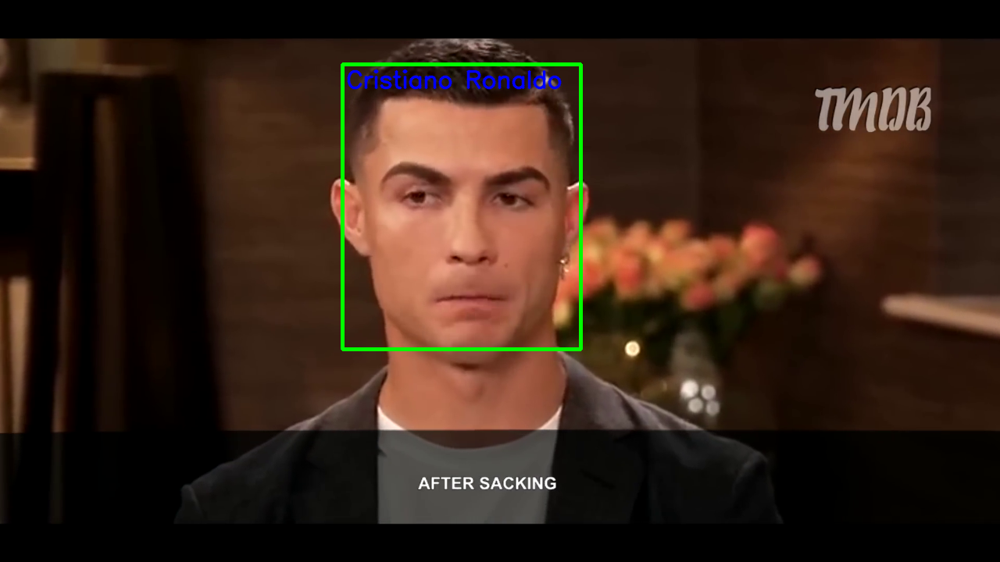

1/1 [==============================] - 0s 40ms/step


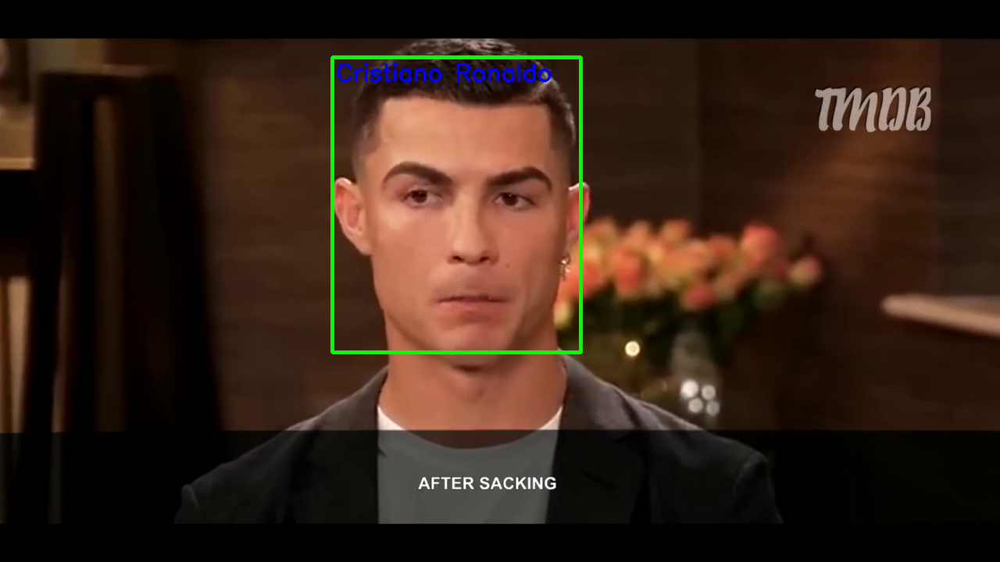

1/1 [==============================] - 0s 48ms/step


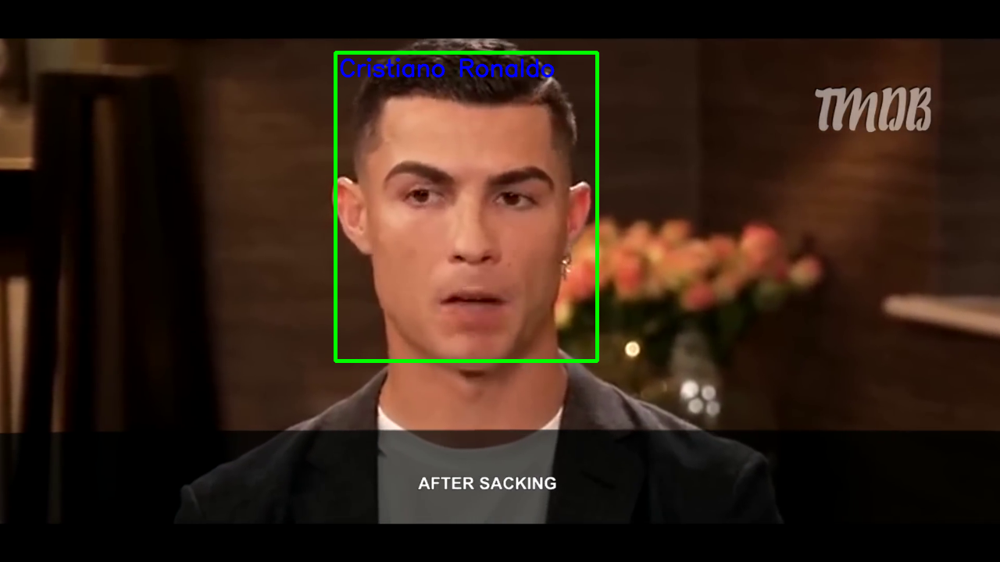

1/1 [==============================] - 0s 43ms/step


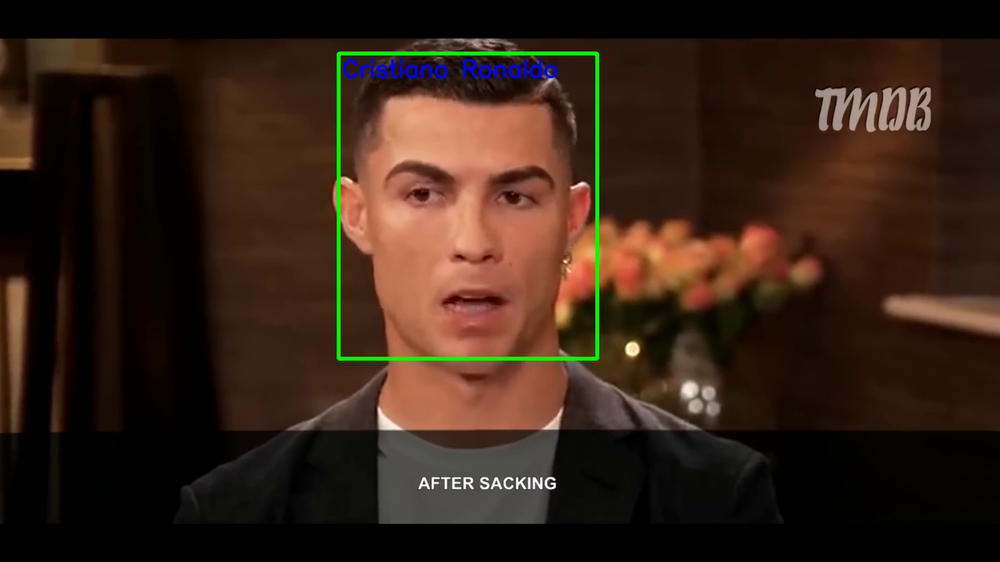

1/1 [==============================] - 0s 78ms/step


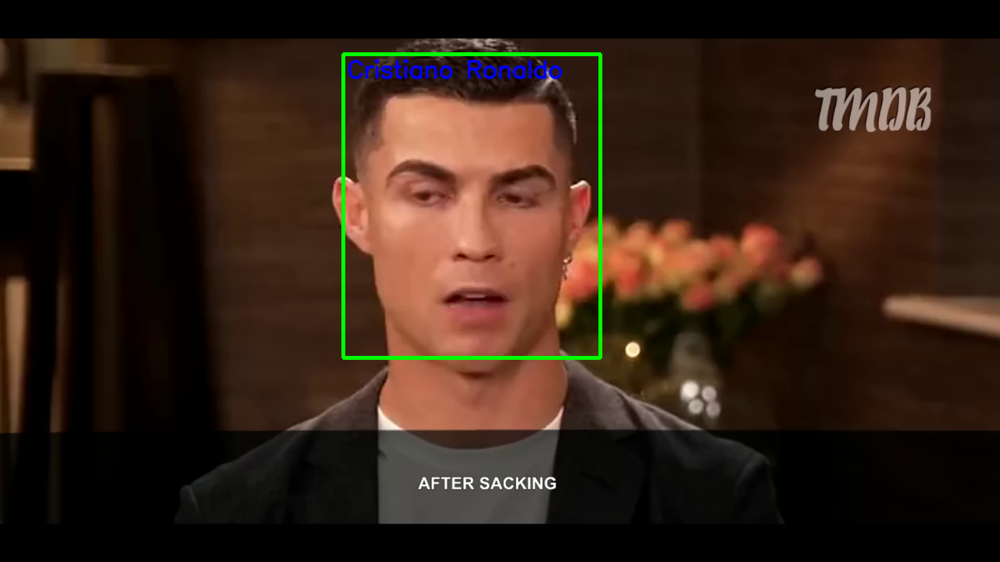

1/1 [==============================] - 0s 84ms/step


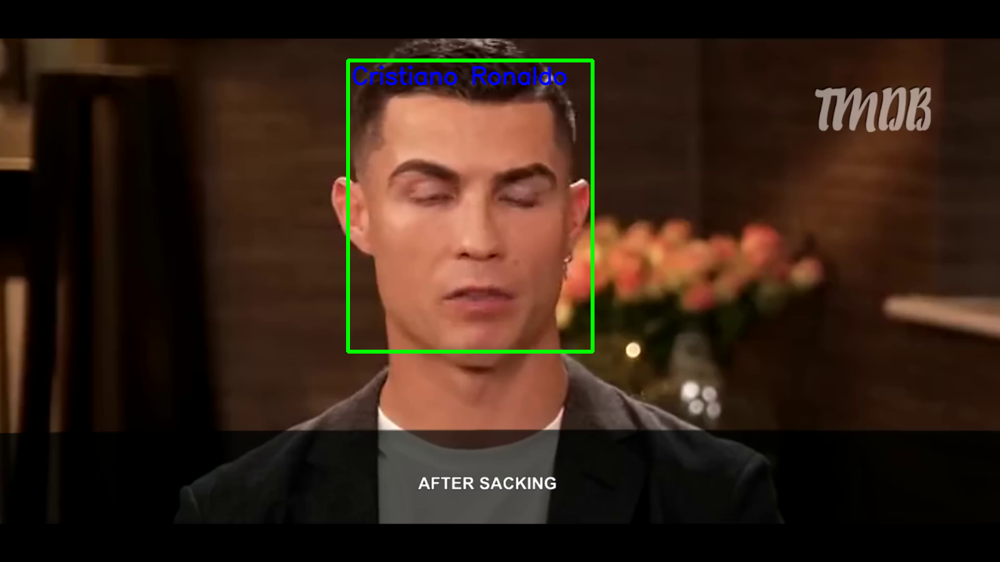

KeyboardInterrupt: ignored

In [41]:
# Load video
cap = cv2.VideoCapture("/content/drive/MyDrive/Biometrics/HW1/input-ronaldo.mp4")

while True:
    ret, frame = cap.read()
    if not ret:
        break
    
    frame = cv2.resize(frame, (1280, 720))

    face_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Biometrics/HW1/haarcascade_frontalface_default.xml')
    num_faces = face_detector.detectMultiScale(frame, scaleFactor=1.3, minNeighbors=5)

    for (x, y, w, h) in num_faces:
        cv2.rectangle(frame, (x, y-50), (x+w, y+h+10), (0, 255, 0), 4)
        
        roi_frame = frame[y:y + h, x:x + w]
        cropped_img = cv2.resize(roi_frame, (100, 100))  
        cropped_img = np.expand_dims(cropped_img, axis=0)  
        cropped_img = cropped_img / 255.0  

        face_recognition = m.predict(cropped_img)
        maxindex = int(np.argmax(face_recognition))
        
        name_of_face = list_labels[maxindex]
        cv2.putText(frame, name_of_face, (x+5, y-20), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2, cv2.LINE_AA)

    cv2_imshow(frame)
    
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()